#NEURAL NETWORKS AND DEEP LEARNING
> M.Sc. ICT FOR LIFE AND HEALTH
> 
> Department of Information Engineering

> M.Sc. COMPUTER ENGINEERING
>
> Department of Information Engineering

> M.Sc. AUTOMATION ENGINEERING
>
> Department of Information Engineering
 
> M.Sc. PHYSICS OF DATA
>
> Department of Physics and Astronomy
 
> M.Sc. COGNITIVE NEUROSCIENCE AND CLINICAL NEUROPSYCHOLOGY
>
> Department of General Psychology

---
A.A. 2020/21 (6 CFU) - Dr. Alberto Testolin, Dr. Matteo Gadaleta
---

# Homework 2 - Unsupervised Deep Learning
## General overview
In this homework you will learn how to implement and test neural network models for solving unsupervised problems. For simplicity and to allow continuity with the kind of data you have seen before, the homework will be based on images of handwritten digits (MNIST). However, you can optionally explore different image collections (e.g., [Caltech](http://www.vision.caltech.edu/Image_Datasets/Caltech101/) or [Cifar](https://www.cs.toronto.edu/~kriz/cifar.html)) or other datasets based on your interests. The basic tasks for the homework will require to test and analyze the convolutional autoencoder implemented during the Lab practice. If you prefer, you can opt for a fully-connected autoencoder, which should achieve similar performance considering the relatively small size of the MNIST images. As for the previous homework, you should explore the use of advanced optimizers and regularization methods. Learning hyperparameters should be tuned using appropriate search procedures, and final accuracy should be evaluated using a cross-validation setup. More advanced tasks will require the exploration of denoising and variational architectures.


## Technical notes
The homework should be implemented in Python using the PyTorch framework. The student can explore additional libraries and tools to implement the models; however, please make sure you understand the code you are writing because during the exam you might receive specific questions related to your implementation. The entire source code required to run the homework must be uploaded as a compressed archive in a Moodle section dedicated to the homework. If your code will be entirely included in a single Python notebook, just upload the notebook file.



## Final report
Along with the source code, you must separately upload a PDF file containing a brief report of your homework. The report should include a brief Introduction on which you explain the homework goals and the main implementation strategies you choose, a brief Method section where you describe your model architectures and hyperparameters, and a Result section where you present the simulation results. Total length must not exceed 6 pages, though you can include additional tables and figures in a final Appendix (optional).



## Grade
The maximum grade for this homework will be **8 points**. Points will be assigned based on the correct implementation of the following items:
*	1 pt: implement and test (convolutional) autoencoder, reporting the trend of reconstruction loss and some examples of image reconstruction
*	1 pt: explore advanced optimizers and regularization methods 
*	1 pt: optimize hyperparameters using grid/random search and cross-validation
*	1 pt: implement and test denoising (convolutional) autoencoder
*	1 pt: fine-tune the (convolutional) autoencoder using a supervised classification task (you can compare classification accuracy and learning speed with results achieved in homework 1)
*	1 pt: explore the latent space structure (e.g., PCA, t-SNE) and generate new samples from latent codes
*	2 pt: implement variational (convolutional) autoencoder or GAN



## Deadline
The complete homework (source code + report) must be submitted through Moodle at least 10 days before the chosen exam date.

# Autoencoder

## Libraries and Packages

In [1]:
!pip install ray[tune]
!pip install tensorboard

In [2]:
%load_ext tensorboard

In [3]:
import matplotlib.pyplot as plt # plotting library
import numpy as np # this module is useful to work with numerical arrays
import pandas as pd # this module is useful to work with tabular data
import random # this module will be used to select random samples from a collection
import os # this module will be used just to create directories in the local filesystem
from tqdm import tqdm # this module is useful to plot progress bars

import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader, random_split, ConcatDataset, SubsetRandomSampler
from torch import nn

from sklearn.model_selection import train_test_split, KFold

# from ray import tune
# from ray.tune import CLIReporter, JupyterNotebookReporter
# from ray.tune.schedulers import ASHAScheduler

## Dataset

### Define the dataset

In [5]:
### Download the data and create dataset
data_dir = 'dataset'

# With these commands the train and test datasets, respectively, are downloaded 
# automatically and stored in the local "data_dir" directory.
train_dataset = torchvision.datasets.MNIST(data_dir, train=True, download=True)
test_dataset  = torchvision.datasets.MNIST(data_dir, train=False, download=True)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting dataset/MNIST/raw/train-images-idx3-ubyte.gz to dataset/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting dataset/MNIST/raw/train-labels-idx1-ubyte.gz to dataset/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting dataset/MNIST/raw/t10k-images-idx3-ubyte.gz to dataset/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting dataset/MNIST/raw/t10k-labels-idx1-ubyte.gz to dataset/MNIST/raw



Let's plot some random samples from the dataset. The first element of the sample is the actual image, while the second is the corresponding label.

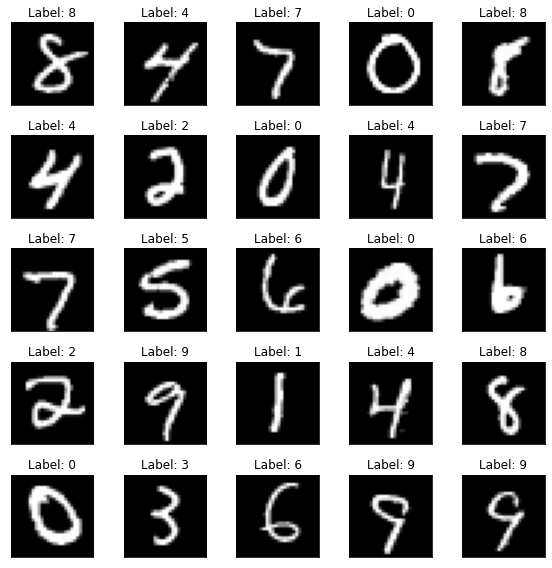

In [6]:
### Plot some sample
fig, axs = plt.subplots(5, 5, figsize=(8,8))
for ax in axs.flatten():
    # random.choice allows to randomly sample from a list-like object (basically anything that can be accessed with an index, like our dataset)
    img, label = random.choice(train_dataset)
    ax.imshow(np.array(img), cmap='gist_gray')
    ax.set_title('Label: %d' % label)
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()

### Define the dataset transform

In this example we are using the input images without any modification. As always, the only requirement is to transform the input data to tensors of the proper shape.

In [7]:
# In this case the train_transform and test_transform are the same, but we keep them separate for potential future updates
train_transform = transforms.Compose([
    transforms.ToTensor(),
])
test_transform = transforms.Compose([
    transforms.ToTensor(),
])

Since we already defined our datasets, this is an alternative (and recommended) way to add (or modify) a dataset transformation without reinitializing the dataset (very useful when the dataset initialization is slow):

In [8]:
# Set the train transform
train_dataset.transform = train_transform

# Set the test and val transform
test_dataset.transform = test_transform

## Encoder

In [25]:
class Encoder(nn.Module):
    
    def __init__(self, encoded_space_dim=32, dropout_rate=0.1):
        super().__init__()
        
        ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            # First convolutional layer
            nn.Conv2d(in_channels=1, out_channels=8, kernel_size=3, stride=2,
                      padding=1),
            nn.ReLU(True),

            # Second convolutional layer
            nn.Conv2d(8, 16, 3, stride=2, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.Dropout2d(dropout_rate),

            # Third convolutional layer
            nn.Conv2d(16, 32, 3, stride=2, padding=0),
            nn.ReLU(True)
        )
        
        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1)

        ### Linear section
        self.encoder_lin = nn.Sequential(
            # First linear layer
            nn.Linear(3 * 3 * 32, 128),
            nn.ReLU(True),
            nn.Dropout(dropout_rate),
            # Second linear layer
            nn.Linear(128, encoded_space_dim)
        )
        
    def forward(self, x):
        # Apply convolutions
        x = self.encoder_cnn(x)
        # Flatten
        x = self.flatten(x)
        # # Apply linear layers
        x = self.encoder_lin(x)
        return x

## Decoder

In [26]:
class Decoder(nn.Module):
    
    def __init__(self, encoded_space_dim=32, dropout_rate=0.1):
        super().__init__()

        ### Linear section
        self.decoder_lin = nn.Sequential(
            # First linear layer
            nn.Linear(encoded_space_dim, 128),
            nn.ReLU(True),

            # Second linear layer
            nn.Linear(128, 3 * 3 * 32),
            nn.ReLU(True)
        )

        ### Unflatten
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(32, 3, 3))

        ### Convolutional section
        self.decoder_conv = nn.Sequential(
            # First transposed convolution
            nn.ConvTranspose2d(32, 16, 3, stride=2, output_padding=0),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.Dropout(dropout_rate),

            # Second transposed convolution
            nn.ConvTranspose2d(16, 8, 3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            nn.Dropout(dropout_rate),

            # Third transposed convolution
            nn.ConvTranspose2d(8, 1, 3, stride=2, padding=1, output_padding=1)
        )
        
    def forward(self, x):
        # Apply linear layers
        x = self.decoder_lin(x)
        # Unflatten
        x = self.unflatten(x)
        # Apply transposed convolutions
        x = self.decoder_conv(x)
        # Apply a sigmoid to force the output to be between 0 and 1 (valid pixel values)
        x = torch.sigmoid(x)
        return x

## Training

### K-fold
Defining the number of folds for KFold cross-validator

In [10]:
# Define the number of folds for KFold cross-validator
num_folds = 5
splits=KFold(n_splits=num_folds, shuffle=True)

### Training function

For a cleaner and more reusable code, we define a training and a testing funcion. This will make the training loop more compact and readable.

The function will train (and test) the network just **for a single epoch**.

In this case, we just track the training loss for each batch. If you want the training loss for the entire epoch, you have to concatenate all the outputs (see the testing function as reference for this case).

In [26]:
### Training function
def train_epoch(encoder, decoder, device, dataloader, loss_fn, optimizer):
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    train_loss = []
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch, _ in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)

        # Encode data
        encoded_data = encoder(image_batch)

        # Decode data
        decoded_data = decoder(encoded_data)

        # Evaluate loss
        loss = loss_fn(decoded_data, image_batch)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Print batch loss
        # print('\t partial train loss (single batch): %f' % (loss.data))
        train_loss.append(loss.detach().cpu().numpy())
    return np.mean(train_loss)


### Testing function

In this case, the testing function has the only goal to evaluate how well we are reproducing the input. We quantify this with the average MSE of the entire test set (which in this case correspond to our loss function, but this is not always true).

Since the entire dataset does not always fit in memory, this example shows how to evaluate the network output in batches, aggregating the results (using `conc_out` and `conc_label` in the code). At the end, you can evaluate a  single overall loss.

In [27]:
### Testing function
def test_epoch(encoder, decoder, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, _ in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            # Encode data
            encoded_data = encoder(image_batch)
            # Decode data
            decoded_data = decoder(encoded_data)
            # Append the network output and the original image to the lists
            conc_out.append(decoded_data.cpu())
            conc_label.append(image_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

The helper function to visuazlize the reconstructed images

In [28]:
def plot_ae_outputs(encoder,decoder,n=10):
    plt.figure(figsize=(16,4.5))
    targets = test_dataset.targets.numpy()
    t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}
    for i in range(n):
      ax = plt.subplot(2,n,i+1)
      img = test_dataset[t_idx[i]][0].unsqueeze(0).to(device)
      encoder.eval()
      decoder.eval()
      with torch.no_grad():
         rec_img  = decoder(encoder(img))
      plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(2, n, i + 1 + n)
      plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.show()

### Training loop

Creating a dictionary of hyperparameters to be passed to the training function.

In [29]:
config = {
    'encoded_space_dim': tune.choice([64, 128]),
    'batch_size': tune.choice([32, 64]),
    'dropout_rate': tune.loguniform(lower=0.1, upper=0.3)
}

Now that we have the training and testing functions, the training loop is considerably simplified. We just need to call these 2 functions for `num_epochs x num_folds` times.

To pass the hyperparameters to tuner, the training function should be created. Arguments are the dictionary of hyperparameters to be tested and the checkpoint directory to save our trained networks. 

To see what happens during the training, we also show the output corresponding to a list of images at the end of each epoch.

In [35]:
from torch.utils.tensorboard import SummaryWriter


def train_networks(config: dict, checkpoint_dir):

    device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
    print(f"Training device: {device}")

    ### Initialize the two networks
    encoder = Encoder(encoded_space_dim=config['encoded_space_dim'],
                      dropout_rate=config['dropout_rate'])
    decoder = Decoder(encoded_space_dim=config['encoded_space_dim'],
                      dropout_rate=config['dropout_rate'])
    encoder.to(device)
    decoder.to(device)
    
    ### Define the loss function
    loss_fn = torch.nn.MSELoss()

    ### Define an optimizer (both for the encoder and the decoder!)
    lr = 1e-3 # Learning rate
    params_to_optimize = [
        {'params': encoder.parameters()},
        {'params': decoder.parameters()}
    ]
    optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-5)

    if checkpoint_dir:
      encoder_state, decoder_state, optimizer_state = torch.load(
          os.path.join(checkpoint_dir, "checkpoint"))
      encoder.load_state_dict(encoder_state)
      decoder.load_state_dict(decoder_state)
      optim.load_state_dict(optimizer_state)

    for fold, (train_idx,val_idx) in enumerate(splits.split(np.arange(len(train_dataset)))):

        print('Fold {}'.format(fold + 1))

        train_sampler = SubsetRandomSampler(train_idx)
        val_sampler = SubsetRandomSampler(val_idx)

        train_loader = DataLoader(train_dataset, batch_size=config['batch_size'],
                                  sampler=train_sampler)
        val_loader = DataLoader(train_dataset, batch_size=config['batch_size'],
                                sampler=val_sampler)

        ### Training cycle
        num_epochs = 4
        for epoch in range(num_epochs):
            print('EPOCH %d/%d' % (epoch + 1, num_epochs))

            ### Training (use the training function)
            train_loss = train_epoch(
                encoder=encoder, 
                decoder=decoder, 
                device=device, 
                dataloader=train_loader, 
                loss_fn=loss_fn, 
                optimizer=optim)
            
            ### Validation  (use the testing function)
            val_loss = test_epoch(
                encoder=encoder, 
                decoder=decoder, 
                device=device, 
                dataloader=val_loader, 
                loss_fn=loss_fn)
            
            # Print Validationloss
            print('\n\n\t VALIDATION - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))

            with tune.checkpoint_dir(epoch) as checkpoint_dir:
              path = os.path.join(checkpoint_dir, "checkpoint")
              torch.save((encoder.state_dict(),
                          decoder.state_dict(),
                          optim.state_dict()),
                          path)
            
            tune.report(train_loss=float(train_loss), val_loss=float(val_loss))

In [32]:
reporter = JupyterNotebookReporter(
    overwrite=True,
    metric_columns=["val_loss", "train_loss", "training_iteration"],
    )

scheduler = ASHAScheduler(
    max_t=10,
    grace_period=2,
    reduction_factor=2,
    metric='val_loss',
    mode='min'
    )

result = tune.run(
    train_networks,
    config=config,
    progress_reporter=reporter,
    num_samples = 40
    scheduler=scheduler,
    keep_checkpoints_num=1,
    checkpoint_score_attr='val_loss',
    # resources_per_trial={'gpu': 1},
    )

Trial name,status,loc,batch_size,dropout_rate,encoded_space_dim,val_loss,train_loss,training_iteration
train_networks_8e3c5_00000,TERMINATED,172.28.0.2:436,64,0.130604,128,0.0166319,0.0270355,2


2022-02-15 10:11:32,429	INFO tune.py:636 -- Total run time: 41.17 seconds (40.12 seconds for the tuning loop).


In [37]:
%tensorboard --logdir ~/ray_results

<IPython.core.display.Javascript object>

In [37]:
best_trial = result.get_best_trial("val_loss", "min", "last")
print("Best trial config: {}".format(best_trial.config))
print("Best trial final validation loss: {}".format(
    best_trial.last_result["val_loss"]))

Best trial config: {'encoded_space_dim': 128, 'batch_size': 64, 'dropout_rate': 0.13060406444343212}
Best trial final validation loss: 0.016631897538900375


In [38]:
best_encoder = Encoder(encoded_space_dim=best_trial.config['encoded_space_dim'],
                       dropout_rate=best_trial.config['dropout_rate'])
best_decoder = Decoder(encoded_space_dim=best_trial.config['encoded_space_dim'],
                       dropout_rate=best_trial.config['dropout_rate'])

In [39]:
best_checkpoint_dir = best_trial.checkpoint.value
print(best_checkpoint_dir)
encoder_state, decoder_state, optimizer_state = torch.load(os.path.join(
    best_checkpoint_dir, "checkpoint"))

best_encoder.load_state_dict(encoder_state)
best_decoder.load_state_dict(decoder_state)

/root/ray_results/train_networks_2022-02-15_10-10-52/train_networks_8e3c5_00000_0_batch_size=64,dropout_rate=0.1306,encoded_space_dim=128_2022-02-15_10-10-53/checkpoint_000000/


<All keys matched successfully>

## Network Analysis

The encoder can be used to evaluate the latent space values for each of the test images. Since we used an encoded space dimension of 2, the encoder maps an entire image to just 2 floating point numbers.

We also save the corresponding label to show how each digit is mapped in the encoded space.

In [68]:
### Get the encoded representation of the test samples
encoded_samples = []
for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0)
    label = sample[1]
    # Encode image
    best_encoder.eval()
    with torch.no_grad():
        encoded_img  = best_encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

100%|██████████| 10000/10000 [00:12<00:00, 769.91it/s]


For convenience (not required), convert the result to a table format (`pandas.DataFrame`):

In [69]:
# Convert to a dataframe
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples

,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3,Enc. Variable 4,Enc. Variable 5,Enc. Variable 6,Enc. Variable 7,Enc. Variable 8,Enc. Variable 9,Enc. Variable 10,Enc. Variable 11,Enc. Variable 12,Enc. Variable 13,Enc. Variable 14,Enc. Variable 15,Enc. Variable 16,Enc. Variable 17,Enc. Variable 18,Enc. Variable 19,Enc. Variable 20,Enc. Variable 21,Enc. Variable 22,Enc. Variable 23,Enc. Variable 24,Enc. Variable 25,Enc. Variable 26,Enc. Variable 27,Enc. Variable 28,Enc. Variable 29,Enc. Variable 30,Enc. Variable 31,Enc. Variable 32,Enc. Variable 33,Enc. Variable 34,Enc. Variable 35,Enc. Variable 36,Enc. Variable 37,Enc. Variable 38,Enc. Variable 39,...,Enc. Variable 89,Enc. Variable 90,Enc. Variable 91,Enc. Variable 92,Enc. Variable 93,Enc. Variable 94,Enc. Variable 95,Enc. Variable 96,Enc. Variable 97,Enc. Variable 98,Enc. Variable 99,Enc. Variable 100,Enc. Variable 101,Enc. Variable 102,Enc. Variable 103,Enc. Variable 104,Enc. Variable 105,Enc. Variable 106,Enc. Variable 107,Enc. Variable 108,Enc. Variable 109,Enc. Variable 110,Enc. Variable 111,Enc. Variable 112,Enc. Variable 113,Enc. Variable 114,Enc. Variable 115,Enc. Variable 116,Enc. Variable 117,Enc. Variable 118,Enc. Variable 119,Enc. Variable 120,Enc. Variable 121,Enc. Variable 122,Enc. Variable 123,Enc. Variable 124,Enc. Variable 125,Enc. Variable 126,Enc. Variable 127,label
0,-0.149987,-0.622521,0.544727,0.806015,0.532433,0.119558,-0.646177,-0.359892,-0.204134,-0.198327,0.001039,0.047819,0.041070,0.339474,0.245983,0.210218,-0.474469,-0.285558,-0.278423,0.749387,0.324028,0.031900,0.166340,0.292487,0.099141,0.279581,-0.464762,0.815349,0.471512,-0.296827,-0.153944,-0.480341,0.403335,-0.281942,-0.229252,-0.543481,-0.438471,0.400914,-0.274905,0.049864,...,-0.114876,-0.345690,-0.349331,-0.179465,0.170258,0.623956,0.278294,-0.393570,0.029409,1.099401,0.194055,-0.219574,-0.050889,0.276392,0.041603,-0.212376,-0.185486,0.096633,0.189462,-0.056044,0.099626,0.287111,-0.381926,-0.309388,-0.306104,-0.369973,-0.330329,0.145237,-0.417918,-0.005623,0.031968,-0.327932,-0.596637,0.592764,0.408599,0.082678,-0.032558,-0.058452,0.495296,7
1,-0.305666,-0.411021,0.356767,-0.584068,-0.333020,-0.007589,-0.094405,-0.225657,-0.032141,-0.750355,0.200435,-0.710343,0.305990,-0.010755,-1.071384,-0.418342,0.234187,0.440234,-0.555358,-0.168534,-0.253504,0.800215,-0.048286,-0.548428,-0.106714,-0.610143,-0.427020,-0.187731,-0.716262,-0.421540,0.634809,0.046651,0.825314,-0.722888,0.217914,0.249569,0.232771,0.182930,-0.639969,-0.313947,...,0.319590,0.338187,0.509838,0.113944,-0.554226,-0.938444,-0.078836,-0.310762,0.789841,-0.153611,-0.338802,0.232736,0.329320,-0.271683,0.719908,0.657286,-0.755092,-0.453202,0.057166,0.513417,-0.543553,-1.006714,-0.434959,0.047027,-0.200393,0.194148,-0.351530,-0.753062,-0.085536,-0.076684,1.614012,0.644880,0.288269,-0.141196,-0.411036,0.257519,-0.175617,0.706962,0.440863,2
2,-0.172400,0.187969,0.440449,0.153524,0.031215,-0.496364,-0.165306,0.070803,-0.167337,0.194885,-0.262464,-0.245571,-0.255480,-0.112991,0.116107,0.091541,-0.038776,0.087745,-0.067481,0.080695,-0.021280,0.043527,0.245857,-0.126535,-0.076270,-0.396719,0.039945,-0.279822,-0.289383,-0.030095,0.375389,-0.192971,-0.102118,-0.365668,-0.109476,-0.323285,-0.171340,-0.042445,-0.271715,-0.121333,...,0.384159,0.106947,-0.024828,0.055950,0.015897,-0.288993,0.151584,0.120179,-0.016975,0.226186,0.480758,0.195339,-0.371978,0.129179,-0.052502,0.039619,-0.115167,0.032057,0.001130,0.557003,-0.099933,0.110730,0.012591,0.273249,0.144644,-0.014328,0.011376,0.154792,-0.389129,-0.204839,0.172604,0.248097,0.037521,0.029629,0.030040,0.309865,-0.122097,0.223311,-0.049934,1
3,-0.544411,-0.887049,-0.487607,-0.614368,1.231314,0.499162,0.366294,0.096472,0.658661,-0.209614,0.311230,-0.031936,0.497928,0.072071,-0.181729,0.564539,-0.443980,-0.884844,-0.062140,0.097321,-0.787415,-0.276837,-0.512668,-0.677999,0.591494,0.631254,-0.124184,-0.181123,0.606420,-0.969490,0.235565,-0.415253,0.147123,-0.927650,-0.726286,-0.288624,

In [43]:
import plotly.express as px
px.scatter(encoded_samples, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples.label.astype(str), opacity=0.7)

> **NOTE**
> 
> The encoded space may have many more variables. In this case you can still have a visual representation of the encoded space by applying a dimensionality reduction method, such as:
- [Princiapal Component Analysis (PCA)](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)
- [t-distributed Stochastic Neighbor Embedding (t-SNE)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html)




In [36]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2)
tsne_results = tsne.fit_transform(encoded_samples.drop(['label'],axis=1))
fig = px.scatter(tsne_results, x=0, y=1,
                 color=encoded_samples.label.astype(str),
                 labels={'0': 'tsne-2d-one', '1': 'tsne-2d-two'})
fig.show()

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



### Visualization

Visualization of activation maps

In [96]:
activation = {}
def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook

Training device: cpu


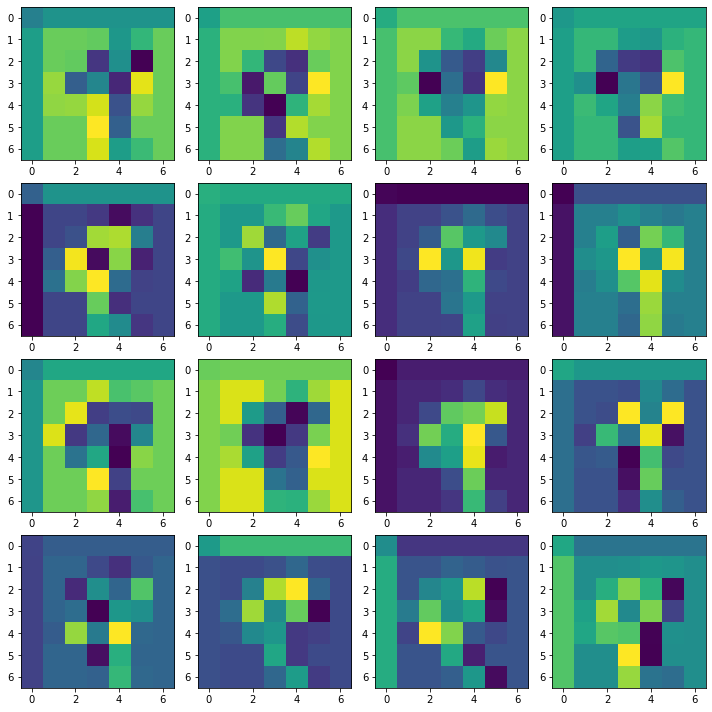

In [125]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f"Training device: {device}")

best_encoder.encoder_cnn[2].register_forward_hook(get_activation('encoder_cnn[2]'))
data, _ = train_dataset[4]
data=data.to(device)
data.unsqueeze_(0)
output = best_encoder(data)

k=0
act = activation['encoder_cnn[2]'].squeeze()
fig,ax = plt.subplots(4,4,figsize=(10, 10))

for i in range(act.size(0)//4):
        for j in range(act.size(0)//4):
           ax[i,j].imshow(act[k].detach().cpu().numpy())
           k+=1    
           plt.tight_layout()
           plt.savefig('fm1.png') 

# Denoising Autoencoder

I am using the same network architecture for the Denoising Autoencoder that I used before for a regular Autoencoder. The difference between them is the data that they are being trained on. Since the whole purpose of Denoising Autoencoder is to clean images corrupted by random noises to restore its original form as much as possible, I am just using the corrupted MNIST handwritten digit dataset. 

## Dataset

In [10]:
m=len(train_dataset)
batch_size=64

train_data, val_data = random_split(train_dataset, [int(m-m*0.2), int(m*0.2)])

In [12]:
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size,
                                           shuffle=True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size)

Adding random noise to the batch of data.

In [19]:
def add_noise(inputs,noise_factor=0.3):
    # create a tensor with the same shape of inputs
    # noise factore determines how strong the noise should be
    noisy = inputs+torch.randn_like(inputs) * noise_factor 
    noisy = torch.clip(noisy,0.,1.) # clipping values to be between 0.0 and 1.0
    return noisy

##Training

### Before training

In [27]:
### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr= 0.001

### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
# best number of nodes for encoding from the previous tune
encoded_space_dim = 64

# default droput rate is 0.1
encoder = Encoder(encoded_space_dim=encoded_space_dim)
decoder = Decoder(encoded_space_dim=encoded_space_dim)
params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]

optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-05)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
encoder.to(device)
decoder.to(device)

Selected device: cpu


Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=64, out_features=128, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=128, out_features=288, bias=True)
    (3): ReLU(inplace=True)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Dropout(p=0.1, inplace=False)
    (4): ConvTranspose2d(16, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (5): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): Dropout(p=0.1, inplace=False)
    (8): ConvTranspose2d(8, 1, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  )
)

### Training function

Almost everything is the same with the train function of the regular autonencoder. The only difference is the usage of ***add_noise()*** function.

In [31]:
### Training function
def train_epoch_den(encoder, decoder, device, dataloader, loss_fn, optimizer,noise_factor=0.3):
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    train_loss = []
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch, _ in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_noisy = add_noise(image_batch,noise_factor)
        image_batch = image_batch.to(device)
        image_noisy = image_noisy.to(device)    
        # Encode data
        encoded_data = encoder(image_noisy)
        # Decode data
        decoded_data = decoder(encoded_data)
        # Evaluate loss
        loss = loss_fn(decoded_data, image_batch)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        print('\t partial train loss (single batch): %f' % (loss.data))
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)

### Testing function

In [32]:
### Testing function
def test_epoch_den(encoder, decoder, device, dataloader, loss_fn,noise_factor=0.3):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, _ in dataloader:
            # Move tensor to the proper device
            image_noisy = add_noise(image_batch,noise_factor)
            image_noisy = image_noisy.to(device)
            # Encode data
            encoded_data = encoder(image_noisy)
            # Decode data
            decoded_data = decoder(encoded_data)
            # Append the network output and the original image to the lists
            conc_out.append(decoded_data.cpu())
            conc_label.append(image_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

### Plot intermediate results

In [33]:
def plot_ae_outputs_den(encoder,decoder,n=10,noise_factor=0.3):
    plt.figure(figsize=(16,4.5))
    targets = test_dataset.targets.numpy()
    t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}    
    for i in range(n):

      ax = plt.subplot(3,n,i+1)
      img = test_dataset[t_idx[i]][0].unsqueeze(0)
      image_noisy = add_noise(img,noise_factor)     
      image_noisy = image_noisy.to(device)

      encoder.eval()
      decoder.eval()

      with torch.no_grad():
         rec_img  = decoder(encoder(image_noisy))

      plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(3, n, i + 1 + n)
      plt.imshow(image_noisy.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Corrupted images')

      ax = plt.subplot(3, n, i + 1 + n + n)
      plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.7, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.3)     
    plt.show()   

In [ ]:
### Training cycle
noise_factor = 0.3
num_epochs = 30
history_da={'train_loss':[],'val_loss':[]}

for epoch in range(num_epochs):
    print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    ### Training (use the training function)
    train_loss=train_epoch_den(
        encoder=encoder, 
        decoder=decoder, 
        device=device, 
        dataloader=train_loader, 
        loss_fn=loss_fn, 
        optimizer=optim,noise_factor=noise_factor)
    ### Validation  (use the testing function)
    val_loss = test_epoch_den(
        encoder=encoder, 
        decoder=decoder, 
        device=device, 
        dataloader=val_loader, 
        loss_fn=loss_fn,noise_factor=noise_factor)
    # Print Validationloss
    history_da['train_loss'].append(train_loss)
    history_da['val_loss'].append(val_loss)
    print('\n EPOCH {}/{} \t train loss {:.3f} \t val loss {:.3f}'.format(epoch + 1, num_epochs,train_loss,val_loss))
    plot_ae_outputs_den(encoder,decoder,noise_factor=noise_factor)

## Testing and Results

###Losses

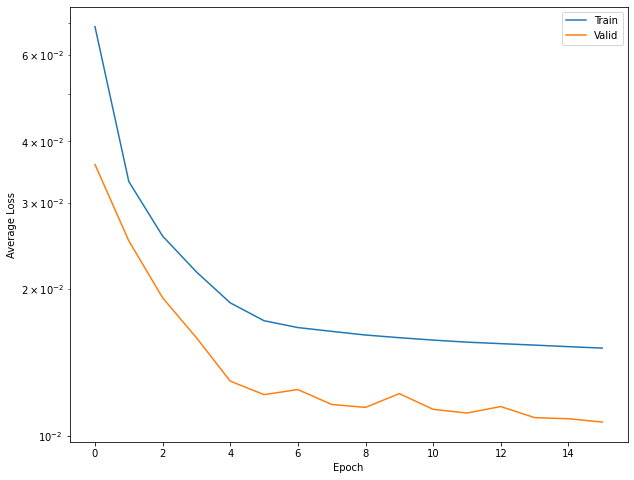

In [35]:
# Plot losses
plt.figure(figsize=(10,8))
plt.semilogy(history_da['train_loss'], label='Train')
plt.semilogy(history_da['val_loss'], label='Valid')
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
#plt.grid()
plt.legend()
#plt.title('loss')
plt.show()

###Testing

Generating new images from the embedding space. First we run the network once to take the embeddings of one batch of images. Then, we learn the mean and variance of the latent space. After having the parameters, we generate new images from the normal distribution with the mean and variance being the same with the latent space of one batch of images. Doing so we assume that latent vector is following a normal distribution while it may not be true since during the training we actually don't force network to learn means and variances of the embeddings rather it tries to map input images to smaller encoding space and reconstruct the original one from that.

Variational autoencoder are better at generating new samples from the latent space as they learn mean and variance of each embedding and eventually output more meaningful results

torch.Size([1024, 64])
torch.Size([64])
tensor([0.2587, 0.2017, 0.2559, 0.3372, 0.2105, 0.2519, 0.2364, 0.2580, 0.2546,
        0.2982, 0.2649, 0.3734, 0.2721, 0.2853, 0.2959, 0.2970, 0.2176, 0.2315,
        0.3170, 0.2418, 0.5285, 0.2558, 0.3892, 0.1813, 0.2810, 0.3898, 0.3627,
        0.3862, 0.3134, 0.2878, 0.2557, 0.2389, 0.3137, 0.3056, 0.3054, 0.2904,
        0.2236, 0.3024, 0.3509, 0.2782, 0.3016, 0.3419, 0.3322, 0.2624, 0.3115,
        0.2365, 0.3205, 0.2843, 0.3507, 0.3051, 0.2353, 0.3030, 0.4453, 0.3011,
        0.3625, 0.2772, 0.3588, 0.2917, 0.3417, 0.2487, 0.3075, 0.3080, 0.2445,
        0.3089])


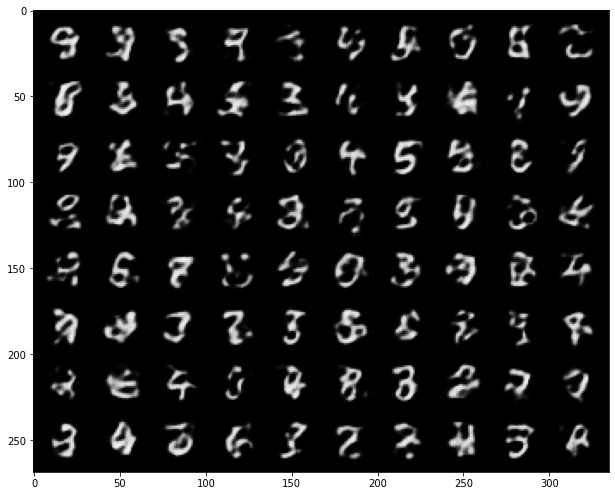

In [52]:
def show_image(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

encoder.eval()
decoder.eval()

with torch.no_grad():
    # calculate mean and std of latent code, generated takining in test images as inputs 
    images, labels = iter(test_loader).next()
    images = images.to(device)
    latent = encoder(images)
    latent = latent.cpu()

    mean = latent.mean(dim=0)
    print(mean.shape)
    # calculate standard deviation sqrt(sum(square(x-mean))/N)
    std = (latent - mean).pow(2).mean(dim=0).sqrt()
    print(std)

    # sample latent vectors from the normal distribution
    num_images = 80

    # sampling from Z~N(μ, σ^2) is the same as sampling from μ + σX, X~N(0,1)
    latent = mean + std*torch.randn(num_images, encoded_space_dim)

    # reconstruct images from the random latent vectors
    latent = latent.to(device)
    img_recon = decoder(latent)
    img_recon = img_recon.cpu()

    fig, ax = plt.subplots(figsize=(20, 8.5))
    show_image(torchvision.utils.make_grid(img_recon[:100],10,5))
    plt.show()

# Variational Autoencoder

##Dataset

In [18]:
### Download the data and create dataset
data_dir = 'dataset'

# With these commands the train and test datasets, respectively, are downloaded 
# automatically and stored in the local "data_dir" directory.
train_dataset = torchvision.datasets.MNIST(data_dir, train=True, download=True)
test_dataset  = torchvision.datasets.MNIST(data_dir, train=False, download=True)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting dataset/MNIST/raw/train-images-idx3-ubyte.gz to dataset/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting dataset/MNIST/raw/train-labels-idx1-ubyte.gz to dataset/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting dataset/MNIST/raw/t10k-images-idx3-ubyte.gz to dataset/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting dataset/MNIST/raw/t10k-labels-idx1-ubyte.gz to dataset/MNIST/raw



In [19]:
# In this case the train_transform and test_transform are the same, but we keep them separate for potential future updates
train_transform = transforms.Compose([
    transforms.ToTensor(),
])
test_transform = transforms.Compose([
    transforms.ToTensor(),
])

In [20]:
# Set the train transform
train_dataset.transform = train_transform

# Set the test and val transform
test_dataset.transform = test_transform

### Dataloader

In [21]:
m=len(train_dataset)
batch_size=64

train_data, val_data = random_split(train_dataset, [int(m-m*0.2), int(m*0.2)])

In [22]:
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size,
                                           shuffle=True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size)

## Variational Encoder

Variational encoder is different than the previous encoders. The difference lies in the fact that instead of just outputting one value for each encoding, we output mean and variance so that we can later sample an encoding from a distribution which has these parameters.

**Reparametrization Trick**

---

While constructing our latent space, we are sampling means and variances from the distributions which prevents the backpropagation of error because of the random sampling.

[This is a picture of what the last layers of Encoder do.](https://miro.medium.com/max/1400/1*eRcdr8gczweQHk--1pZF9A@2x.png)

In [31]:
import torch.nn.functional as F

class VariationalEncoder(nn.Module):
    def __init__(self, latent_dims):  
        super(VariationalEncoder, self).__init__()
        self.conv1 = nn.Conv2d(1, 8, 3, stride=2, padding=1)
        self.conv2 = nn.Conv2d(8, 16, 3, stride=2, padding=1)
        self.batch2 = nn.BatchNorm2d(16)
        self.conv3 = nn.Conv2d(16, 32, 3, stride=2, padding=0)  
        self.linear1 = nn.Linear(3*3*32, 128)
        self.linear2 = nn.Linear(128, latent_dims)
        self.linear3 = nn.Linear(128, latent_dims)

        self.N = torch.distributions.Normal(0, 1)

        if torch.cuda.is_available():
          self.N.loc = self.N.loc.cuda() # hack to get sampling on the GPU
          self.N.scale = self.N.scale.cuda()

        self.kl = 0

    def forward(self, x):
        x = x.to(device)
        x = F.relu(self.conv1(x))
        x = F.relu(self.batch2(self.conv2(x)))
        x = F.relu(self.conv3(x))
        x = torch.flatten(x, start_dim=1)
        x = F.relu(self.linear1(x))

        # sampling
        # one layer outputs mean and another one outputs log standard deviation
        # it gets exponentiated to get normal std.
        mean =  self.linear2(x)
        std = torch.exp(self.linear3(x))

        # reparametrization trick
        # sampling from Z~N(μ, σ^2) is the same as sampling from μ + σX, X~N(0,1)
        z = mean + std*self.N.sample(mean.shape)

        # Kullback-Leibler divergence
        self.kl = (std**2 + mean**2 - torch.log(std) - 1/2).sum()
        return z      

## Decoder

In [32]:
class Decoder(nn.Module):
    
    def __init__(self, latent_dims):
        super().__init__()

        self.decoder_lin = nn.Sequential(
            nn.Linear(latent_dims, 128),
            nn.ReLU(True),
            nn.Linear(128, 3 * 3 * 32),
            nn.ReLU(True)
        )

        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(32, 3, 3))

        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(32, 16, 3, stride=2, output_padding=0),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 8, 3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            nn.ConvTranspose2d(8, 1, 3, stride=2, padding=1, output_padding=1)
        )
        
    def forward(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

## VAE

In [33]:
class VariationalAutoencoder(nn.Module):
    def __init__(self, latent_dims):
        super(VariationalAutoencoder, self).__init__()
        self.encoder = VariationalEncoder(latent_dims)
        self.decoder = Decoder(latent_dims)

    def forward(self, x):
        x = x.to(device)
        z = self.encoder(x)
        return self.decoder(z)

## Training

### Before training

In [34]:
### Set the random seed for reproducible results
torch.manual_seed(0)

d = 4

vae = VariationalAutoencoder(latent_dims=d)

lr = 1e-3 

optim = torch.optim.Adam(vae.parameters(), lr=lr, weight_decay=1e-5)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

vae.to(device)

Selected device: cpu


VariationalAutoencoder(
  (encoder): VariationalEncoder(
    (conv1): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (conv2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (batch2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (linear1): Linear(in_features=288, out_features=128, bias=True)
    (linear2): Linear(in_features=128, out_features=4, bias=True)
    (linear3): Linear(in_features=128, out_features=4, bias=True)
  )
  (decoder): Decoder(
    (decoder_lin): Sequential(
      (0): Linear(in_features=4, out_features=128, bias=True)
      (1): ReLU(inplace=True)
      (2): Linear(in_features=128, out_features=288, bias=True)
      (3): ReLU(inplace=True)
    )
    (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
    (decoder_conv): Sequential(
      (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
      (1): BatchN

### Training function

In the previous models, our loss function was just simply a mean-squared loss between the pixel values of original image and constructed image. We have these loss functions for the network:


1.   Reconstruction loss (same as before)
2.   Kullback-Leibler Divergence loss


What we ideally want are encodings, all of which are as close as possible to each other while still being distinct, allowing smooth interpolation, and enabling the construction of new samples.
In order to force this, we introduce the Kullback–Leibler divergence (KL divergence) into the loss function. The KL divergence between two probability distributions simply measures how much they diverge from each other. Minimizing the KL divergence here means optimizing the probability distribution parameters (μ and σ) to closely resemble that of the target distribution. [link to blog](https://towardsdatascience.com/intuitively-understanding-variational-autoencoders-1bfe67eb5daf).


In [35]:
### Training function
def train_epoch(vae, device, dataloader, optimizer):
    # Set train mode for both the encoder and the decoder
    vae.train()
    train_loss = 0.0
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for x, _ in dataloader: 
        # Move tensor to the proper device
        x = x.to(device)
        x_hat = vae(x)
        # Evaluate loss
        loss = ((x - x_hat)**2).sum() + vae.encoder.kl

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        print('\t partial train loss (single batch): %f' % (loss.item()))
        train_loss+=loss.item()

    return train_loss / len(dataloader.dataset)

### Testing function

In [36]:
### Testing function
def test_epoch(vae, device, dataloader):
    # Set evaluation mode for encoder and decoder
    vae.eval()
    val_loss = 0.0
    with torch.no_grad(): # No need to track the gradients
        for x, _ in dataloader:
            # Move tensor to the proper device
            x = x.to(device)
            # Encode data
            encoded_data = vae.encoder(x)
            # Decode data
            x_hat = vae(x)
            loss = ((x - x_hat)**2).sum() + vae.encoder.kl
            val_loss += loss.item()

    return val_loss / len(dataloader.dataset)

### Plot outputs

In [37]:
def plot_ae_outputs(encoder,decoder,n=10):
    plt.figure(figsize=(16,4.5))
    targets = test_dataset.targets.numpy()
    t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}
    for i in range(n):
      ax = plt.subplot(2,n,i+1)
      img = test_dataset[t_idx[i]][0].unsqueeze(0).to(device)
      encoder.eval()
      decoder.eval()
      with torch.no_grad():
         rec_img  = decoder(encoder(img))
      plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(2, n, i + 1 + n)
      plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.show()

	 partial train loss (single batch): 17294.001953
	 partial train loss (single batch): 16847.191406
	 partial train loss (single batch): 16712.222656
	 partial train loss (single batch): 16193.242188
	 partial train loss (single batch): 15969.720703
	 partial train loss (single batch): 15521.946289
	 partial train loss (single batch): 15266.801758
	 partial train loss (single batch): 15188.971680
	 partial train loss (single batch): 14925.664062
	 partial train loss (single batch): 14919.646484
	 partial train loss (single batch): 14606.621094
	 partial train loss (single batch): 14517.742188
	 partial train loss (single batch): 14416.182617
	 partial train loss (single batch): 14296.243164
	 partial train loss (single batch): 14229.923828
	 partial train loss (single batch): 14207.523438
	 partial train loss (single batch): 14046.337891
	 partial train loss (single batch): 13860.372070
	 partial train loss (single batch): 13855.474609
	 partial train loss (single batch): 13687.577148


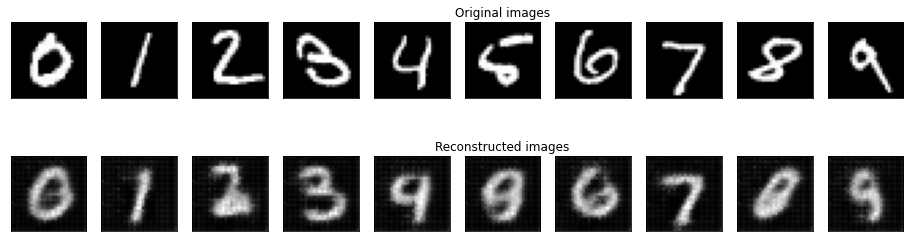

	 partial train loss (single batch): 2726.587891
	 partial train loss (single batch): 2588.929199
	 partial train loss (single batch): 2537.257812
	 partial train loss (single batch): 2754.837646
	 partial train loss (single batch): 2628.001221
	 partial train loss (single batch): 2562.251953
	 partial train loss (single batch): 2621.413086
	 partial train loss (single batch): 2596.314453
	 partial train loss (single batch): 2679.624023
	 partial train loss (single batch): 2606.759766
	 partial train loss (single batch): 2549.565430
	 partial train loss (single batch): 2441.522461
	 partial train loss (single batch): 2727.135742
	 partial train loss (single batch): 2715.021484
	 partial train loss (single batch): 2687.883545
	 partial train loss (single batch): 2606.538574
	 partial train loss (single batch): 2773.237549
	 partial train loss (single batch): 2661.729004
	 partial train loss (single batch): 2622.484863
	 partial train loss (single batch): 2630.367676
	 partial train loss

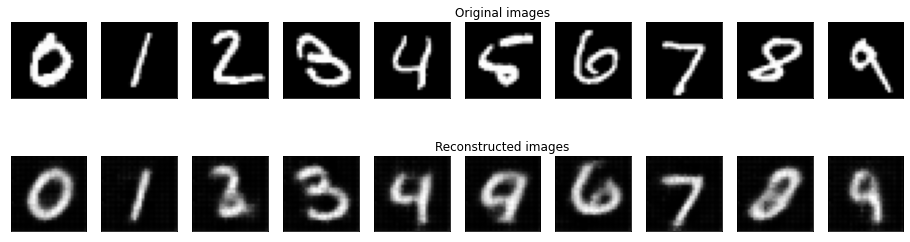

	 partial train loss (single batch): 2388.663086
	 partial train loss (single batch): 2296.478760
	 partial train loss (single batch): 2467.063232
	 partial train loss (single batch): 2285.442627
	 partial train loss (single batch): 2370.360107
	 partial train loss (single batch): 2417.774414
	 partial train loss (single batch): 2327.355957
	 partial train loss (single batch): 2454.541504
	 partial train loss (single batch): 2456.116943
	 partial train loss (single batch): 2483.506592
	 partial train loss (single batch): 2195.553223
	 partial train loss (single batch): 2337.242676
	 partial train loss (single batch): 2480.900146
	 partial train loss (single batch): 2355.075928
	 partial train loss (single batch): 2204.668457
	 partial train loss (single batch): 2401.185059
	 partial train loss (single batch): 2412.886475
	 partial train loss (single batch): 2175.908691
	 partial train loss (single batch): 2172.628418
	 partial train loss (single batch): 2207.675537
	 partial train loss

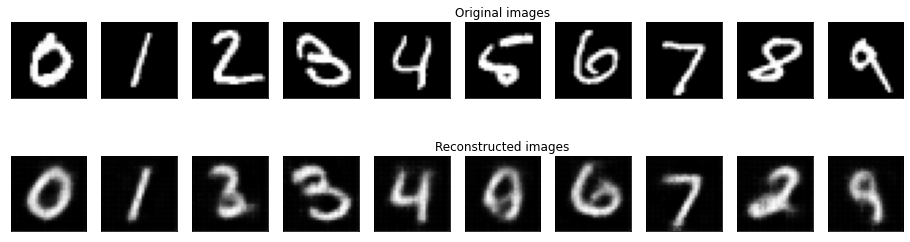

	 partial train loss (single batch): 2172.527832
	 partial train loss (single batch): 2270.878906
	 partial train loss (single batch): 2212.390625
	 partial train loss (single batch): 2291.583984
	 partial train loss (single batch): 2288.166504
	 partial train loss (single batch): 2278.233398
	 partial train loss (single batch): 2152.137451
	 partial train loss (single batch): 2181.755859
	 partial train loss (single batch): 2226.939209
	 partial train loss (single batch): 2144.989990
	 partial train loss (single batch): 2244.818604
	 partial train loss (single batch): 2206.778564
	 partial train loss (single batch): 2368.765869
	 partial train loss (single batch): 2069.169922
	 partial train loss (single batch): 2436.769043
	 partial train loss (single batch): 2242.513428
	 partial train loss (single batch): 2317.957031
	 partial train loss (single batch): 2539.963867
	 partial train loss (single batch): 2237.113281
	 partial train loss (single batch): 2243.889160
	 partial train loss

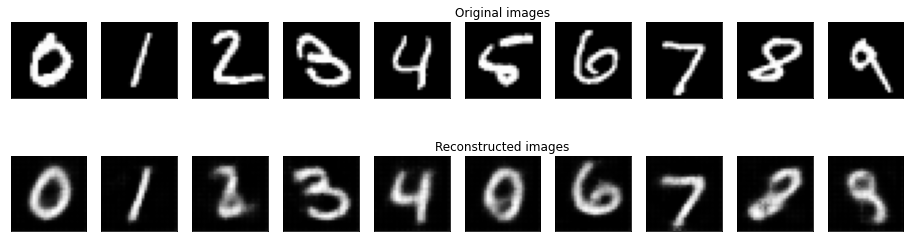

	 partial train loss (single batch): 2033.167725
	 partial train loss (single batch): 2192.622559
	 partial train loss (single batch): 2185.329590
	 partial train loss (single batch): 2105.041016
	 partial train loss (single batch): 2212.679199
	 partial train loss (single batch): 2228.715820
	 partial train loss (single batch): 2153.498535
	 partial train loss (single batch): 2243.985352
	 partial train loss (single batch): 2079.010742
	 partial train loss (single batch): 2309.934814
	 partial train loss (single batch): 2136.314697
	 partial train loss (single batch): 2009.524414
	 partial train loss (single batch): 2187.167236
	 partial train loss (single batch): 2113.381104
	 partial train loss (single batch): 2154.881348
	 partial train loss (single batch): 2119.993164
	 partial train loss (single batch): 1998.855957
	 partial train loss (single batch): 2174.423828
	 partial train loss (single batch): 2222.966064
	 partial train loss (single batch): 2372.663574
	 partial train loss

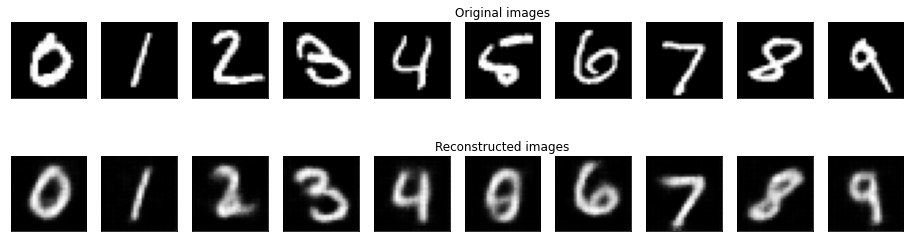

In [38]:
num_epochs = 5

for epoch in range(num_epochs):
   train_loss = train_epoch(vae,device,train_loader, optim)
   val_loss = test_epoch(vae,device, val_loader)

   print('\n EPOCH {}/{} \t train loss {:.3f} \t val loss {:.3f}'.format(
       epoch + 1, num_epochs,train_loss,val_loss))
   
   plot_ae_outputs(vae.encoder,vae.decoder,n=10)

## Results

### Generate samples

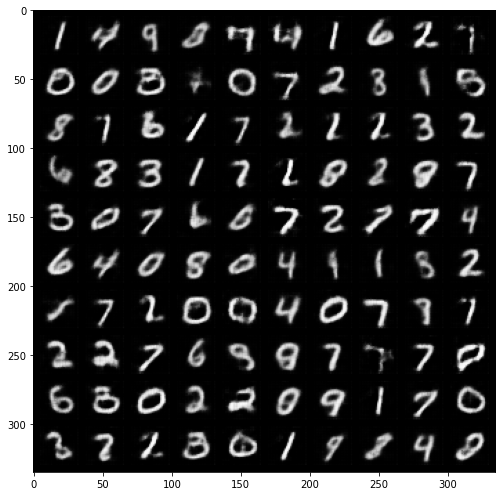

In [39]:
def show_image(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))


vae.eval()

with torch.no_grad():

    # sample latent vectors from the normal distribution
    latent = torch.randn(128, d, device=device)

    # reconstruct images from the latent vectors
    img_recon = vae.decoder(latent)
    img_recon = img_recon.cpu()

    fig, ax = plt.subplots(figsize=(20, 8.5))
    show_image(torchvision.utils.make_grid(img_recon.data[:100],10,5))
    plt.show()